<a href="https://colab.research.google.com/github/SuriyaaVijay/Posture-Recognition/blob/main/Posture_Recognition_Mediapipe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
if 'google.colab' in str(get_ipython()):
    !pip install opencv-python
    !pip install mediapipe
    !wget https://raw.githubusercontent.com/spmallick/learnopencv/blob/master/Posture-analysis-system-using-MediaPipe-Pose/input.mp4
else:
    pass

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3108, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2901, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-package

In [16]:
import cv2
import time
import math as m
import mediapipe as mp

In [17]:
!pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [18]:
# Initilize medipipe selfie segmentation class.
mp_pose = mp.solutions.pose
mp_holistic = mp.solutions.holistic

In [19]:
def findDistance(x1, y1, x2, y2):
    dist = m.sqrt((x2-x1)**2+(y2-y1)**2)
    return dist

In [20]:
# Calculate angle.
def findAngle(x1, y1, x2, y2):
    theta = m.acos((y2 -y1)*(-y1) / (m.sqrt((x2 - x1)**2 + (y2 - y1)**2) * y1))
    degree = int(180/m.pi)*theta
    return degree

In [21]:
def sendWarning():
    print('YOU ARE IN WRONG POSITION FOR LONG TIME')

In [22]:
# Initilize frame counters.
good_frames = 0
bad_frames = 0

# Font type.
font = cv2.FONT_HERSHEY_SIMPLEX

# Colors.
blue = (255, 127, 0)
red = (50, 50, 255)
green = (127, 255, 0)
dark_blue = (127, 20, 0)
light_green = (127, 233, 100)
yellow = (0, 255, 255)
pink = (255, 0, 255)

In [23]:
from google.colab.patches import cv2_imshow
import os

In [24]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


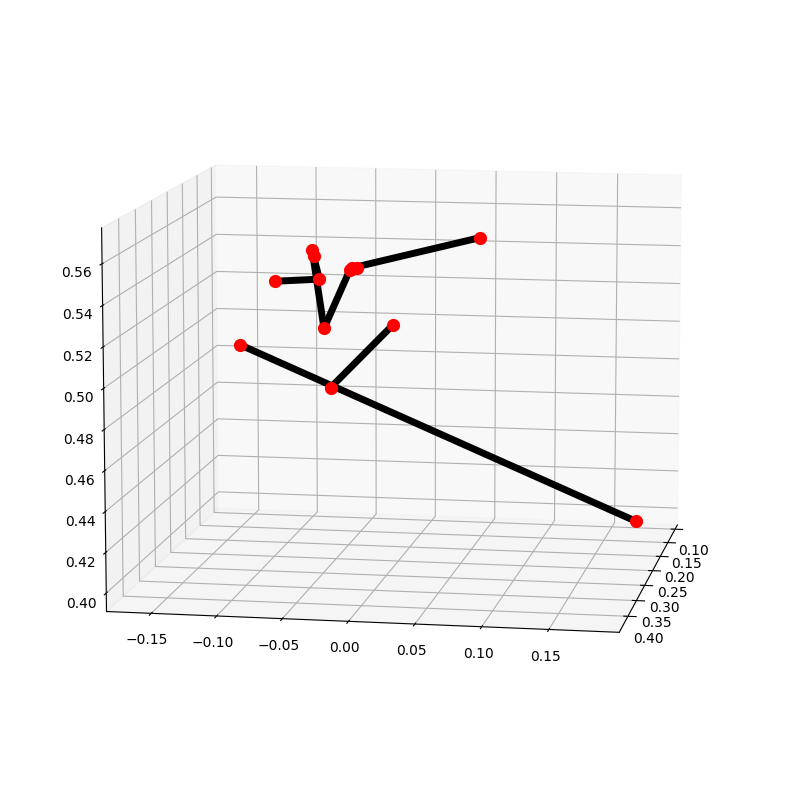

z: -1279.6717834472656
YOU ARE IN WRONG POSITION FOR LONG TIME


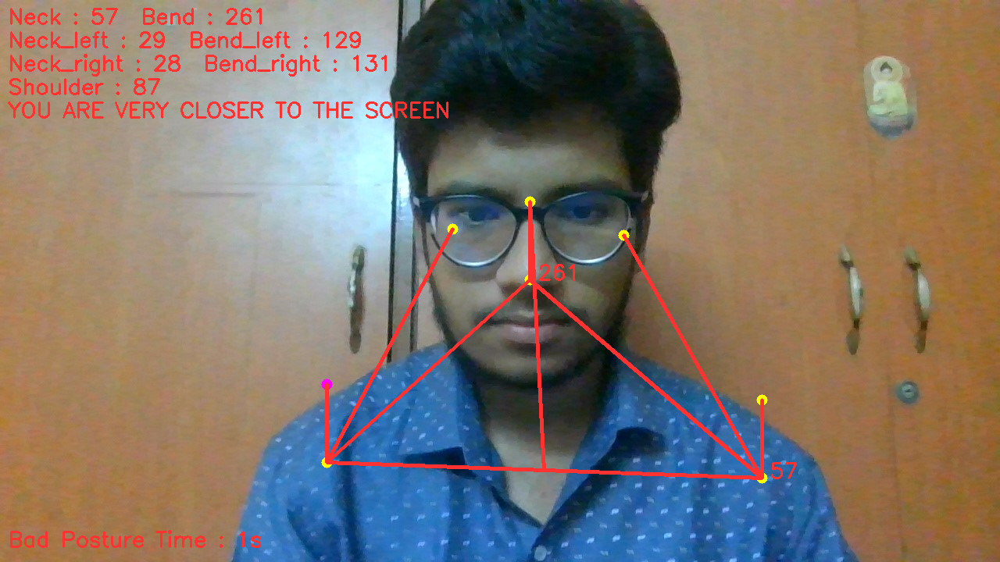

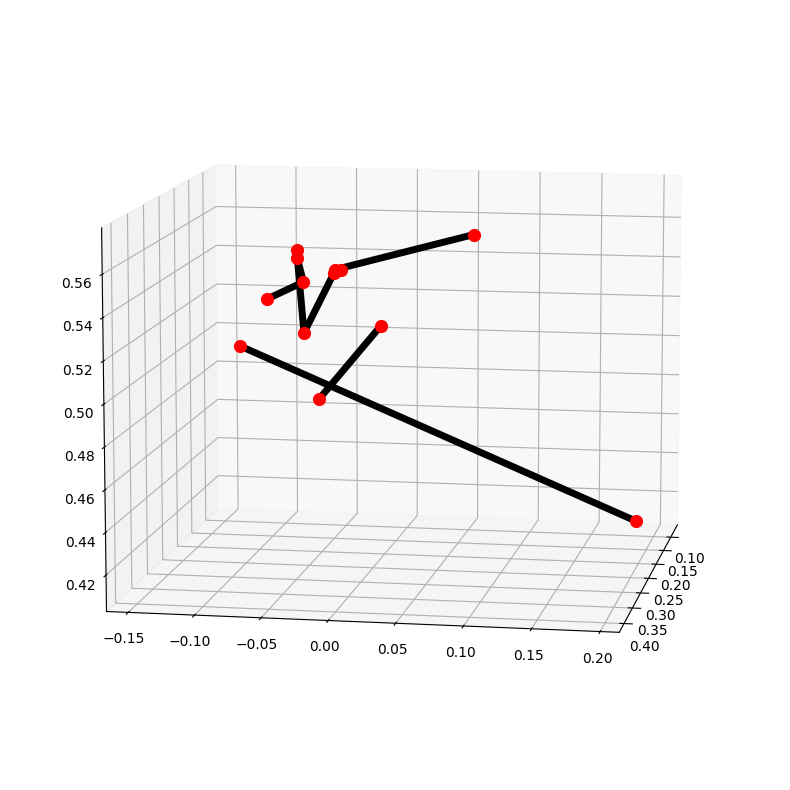

z: -1321.9186401367188
YOU ARE IN WRONG POSITION FOR LONG TIME


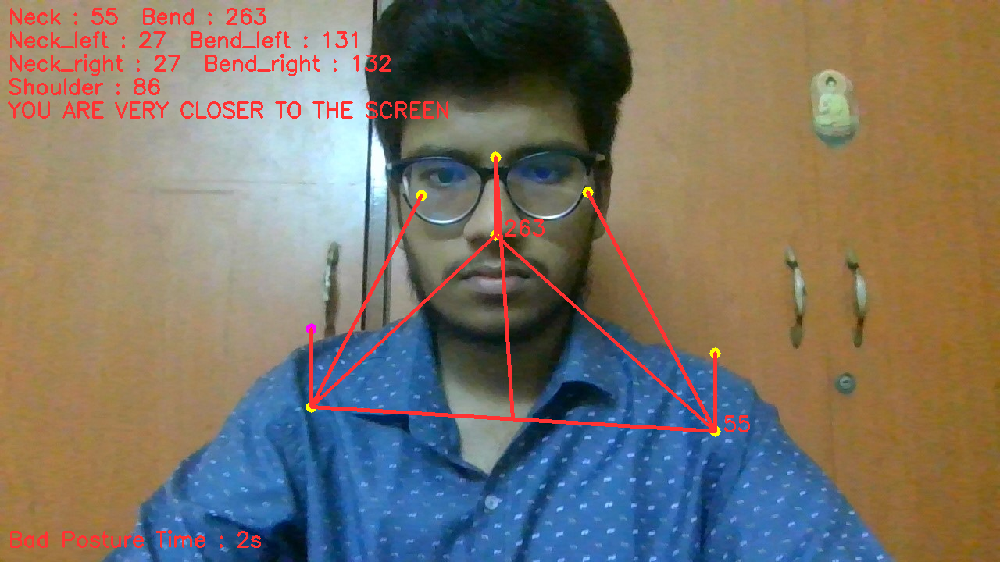

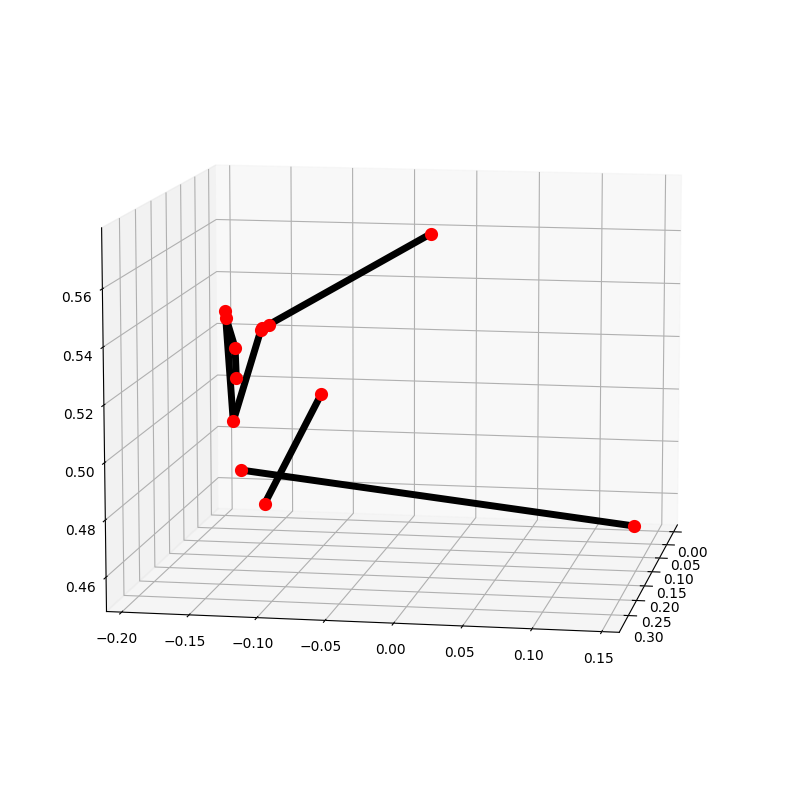

z: -1100.3401947021484
YOU ARE IN WRONG POSITION FOR LONG TIME


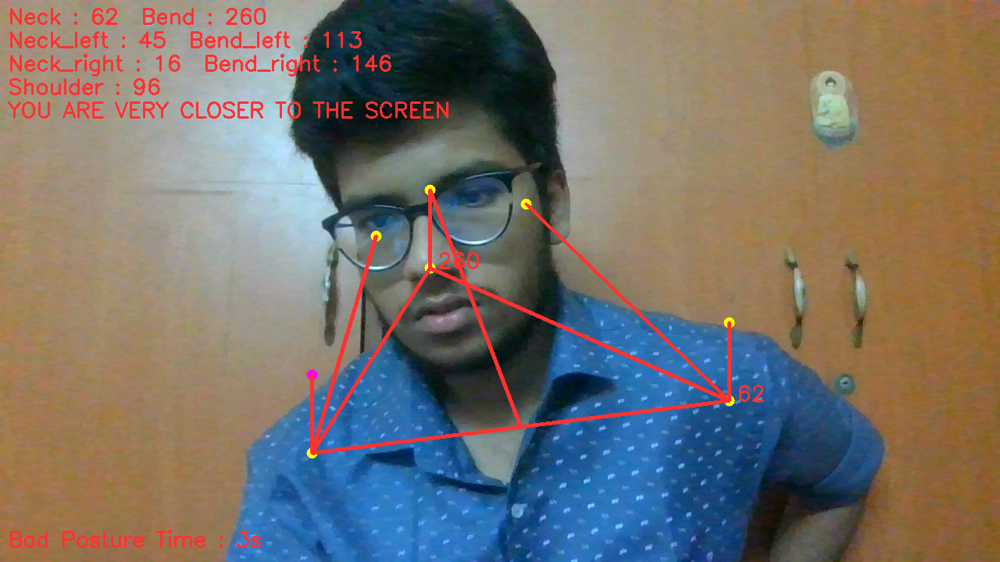

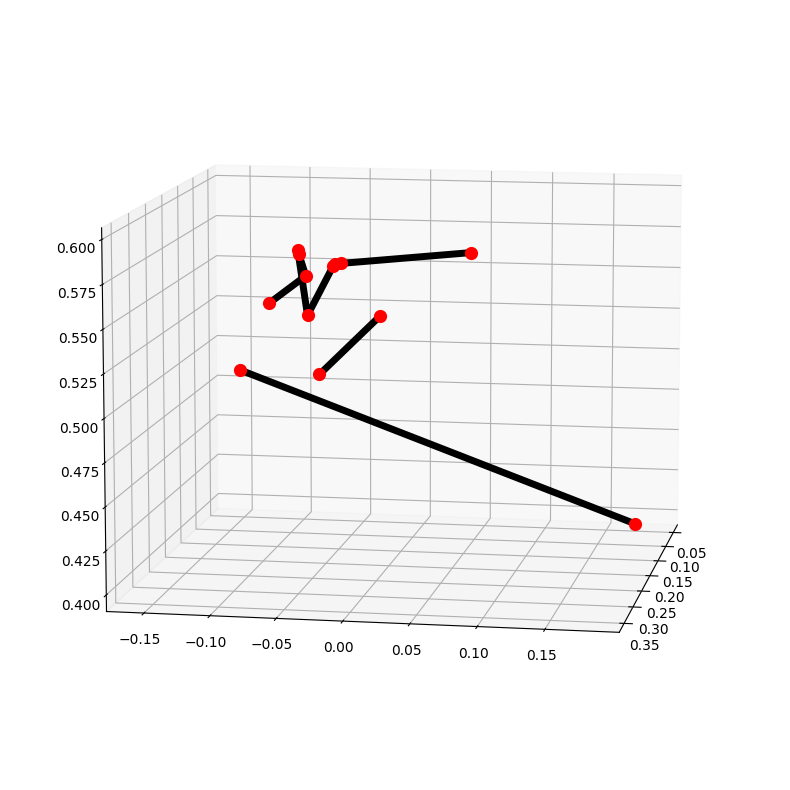

z: -932.9228210449219
YOU ARE IN WRONG POSITION FOR LONG TIME


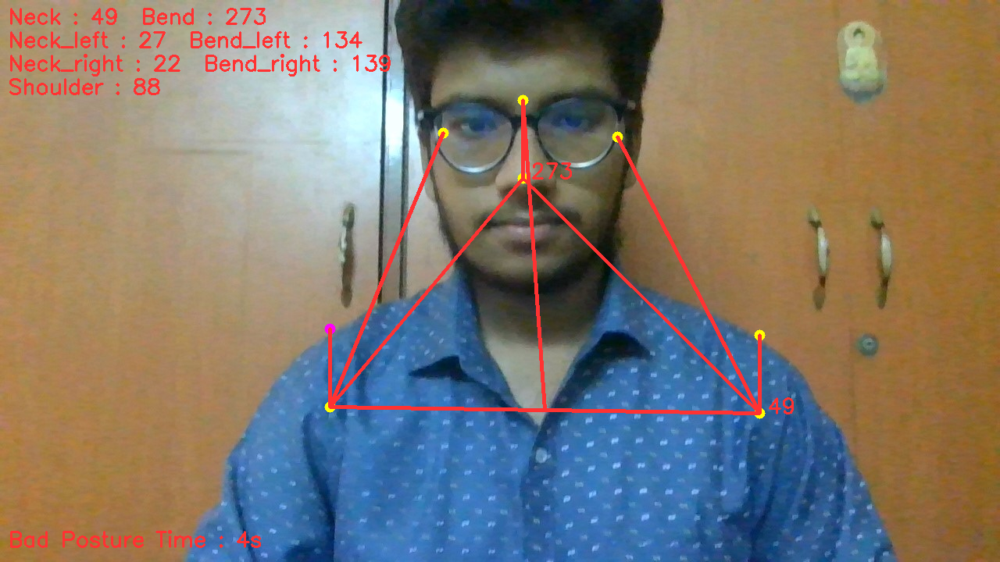

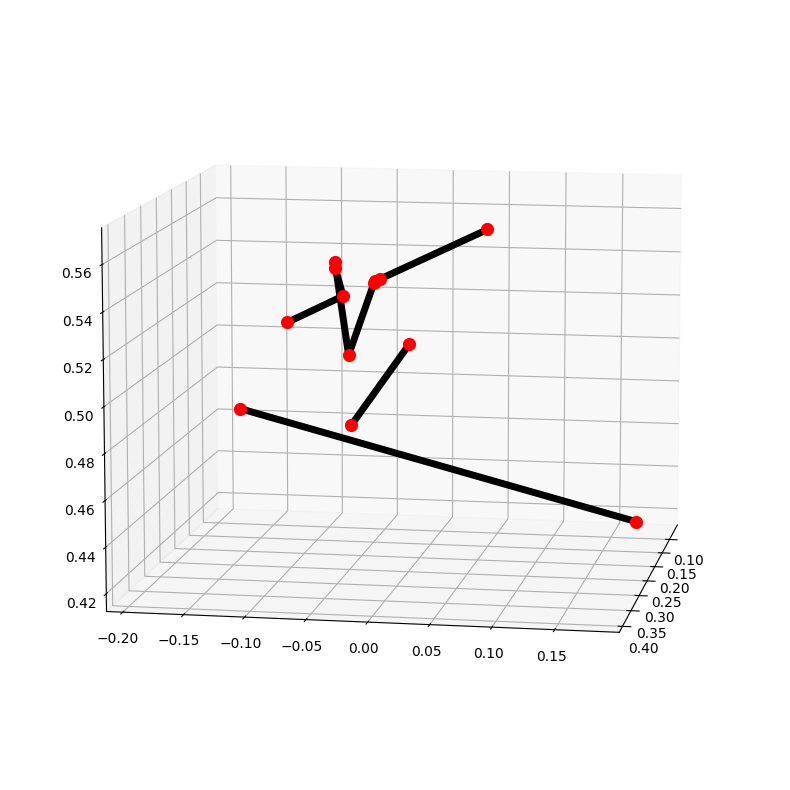

z: -1217.0680236816406
YOU ARE IN WRONG POSITION FOR LONG TIME


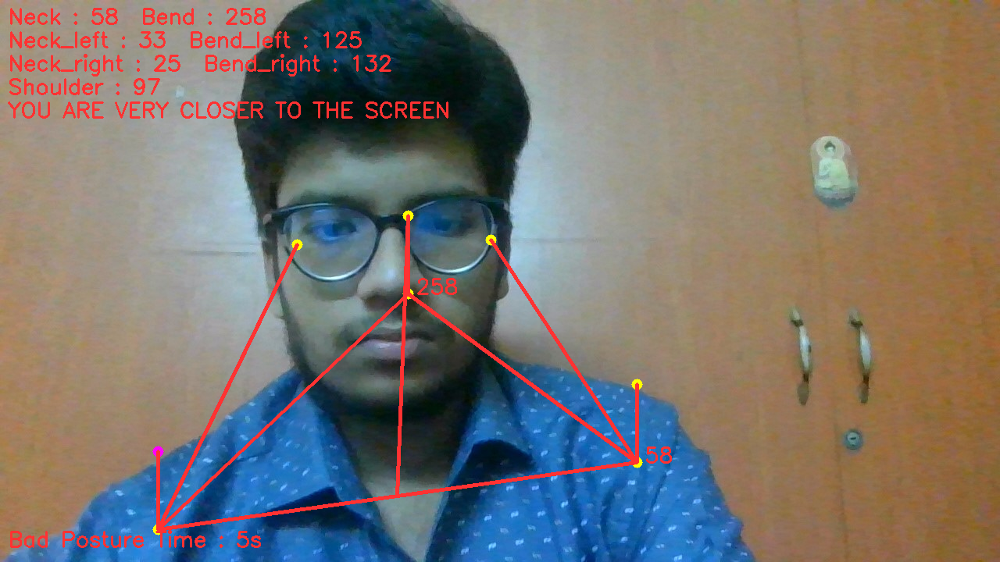

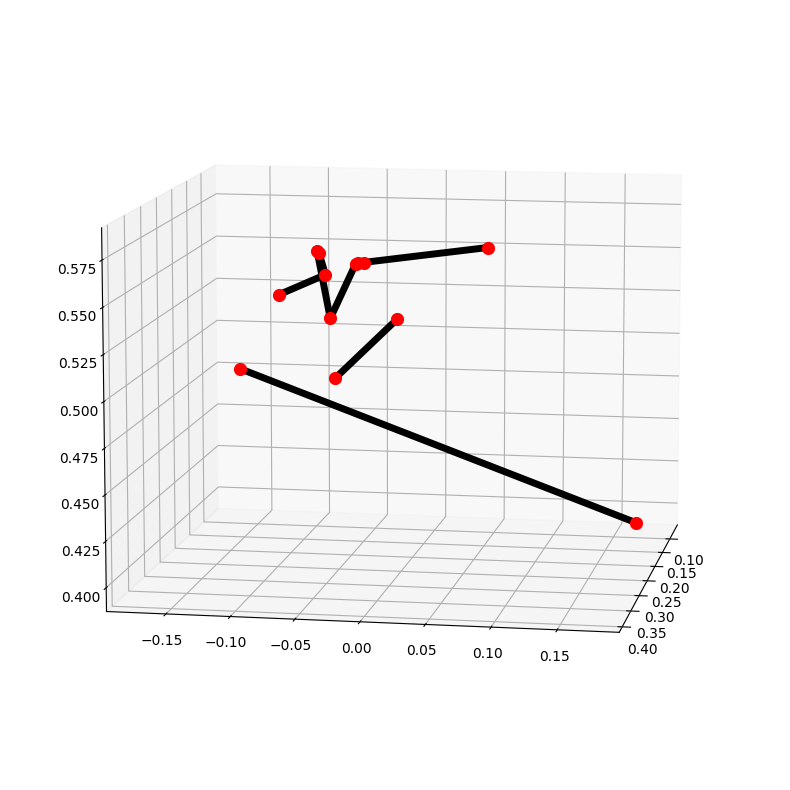

z: -1050.8866882324219


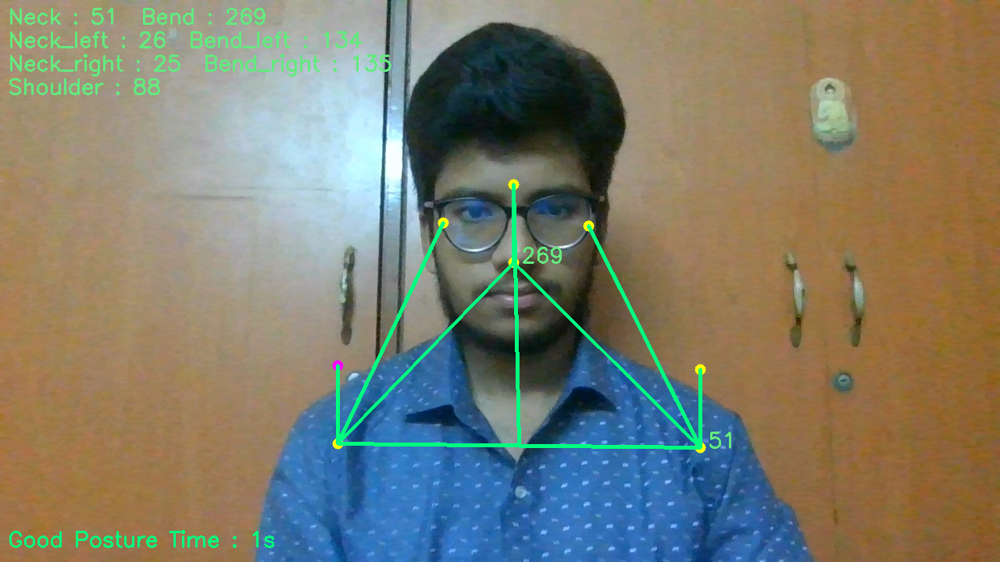

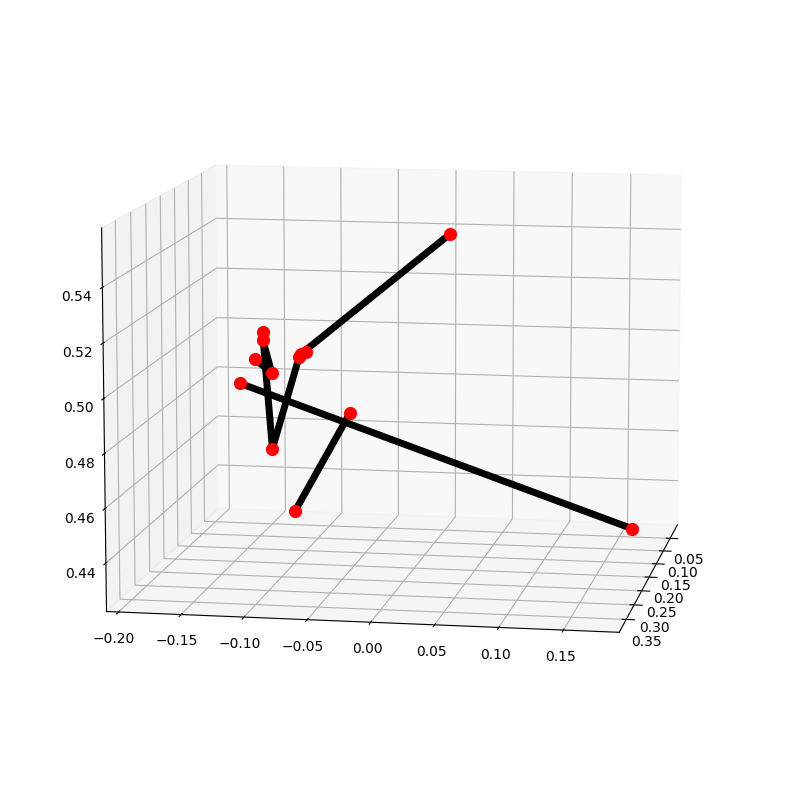

z: -1168.4771728515625
YOU ARE IN WRONG POSITION FOR LONG TIME


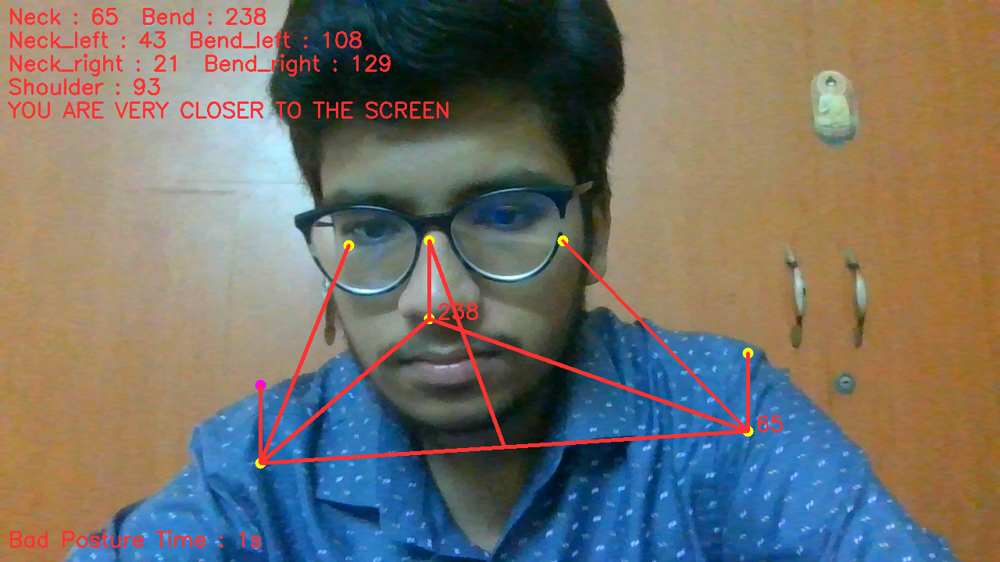

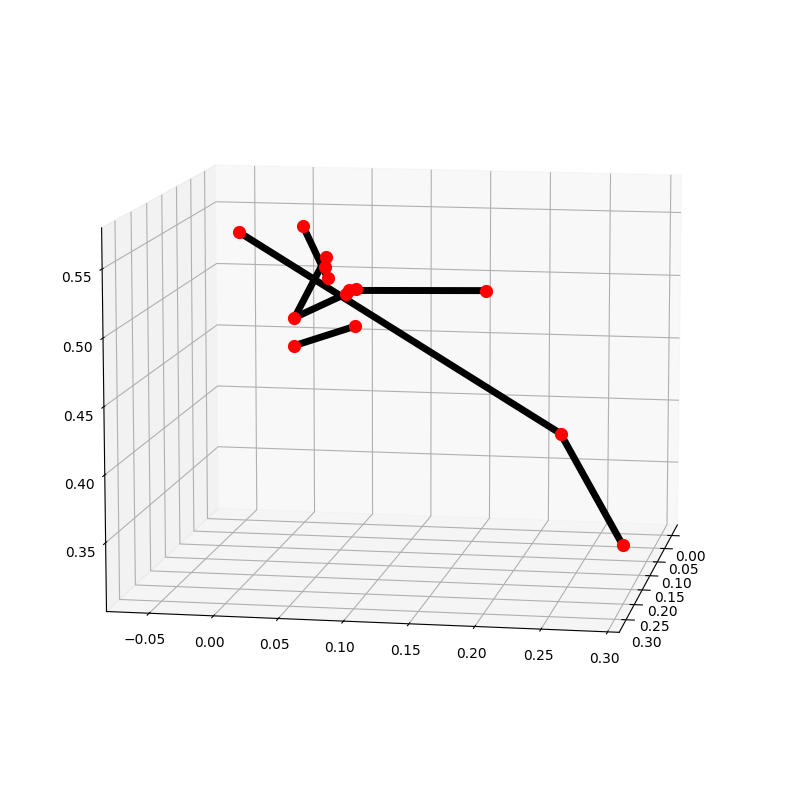

z: -886.2391662597656
YOU ARE IN WRONG POSITION FOR LONG TIME


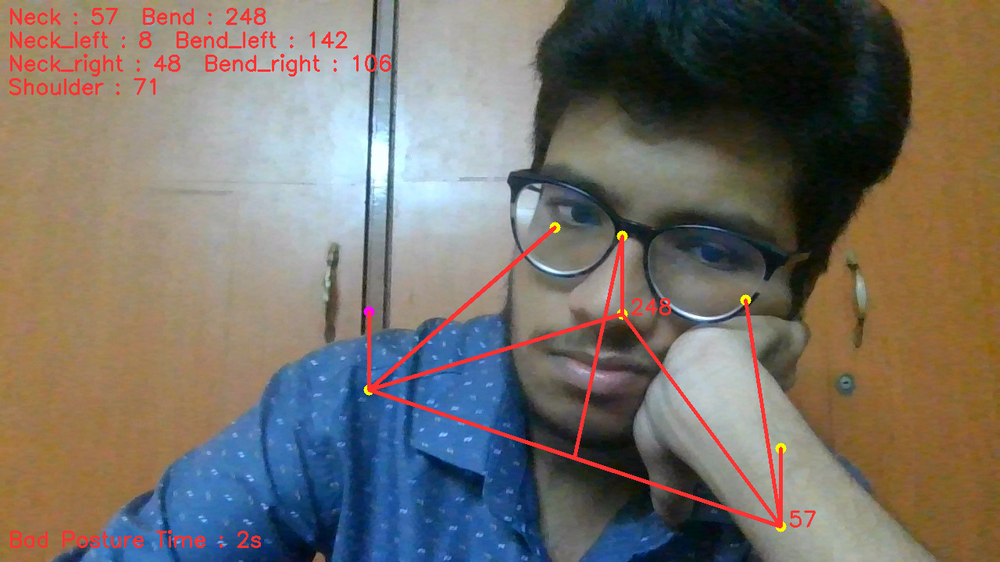

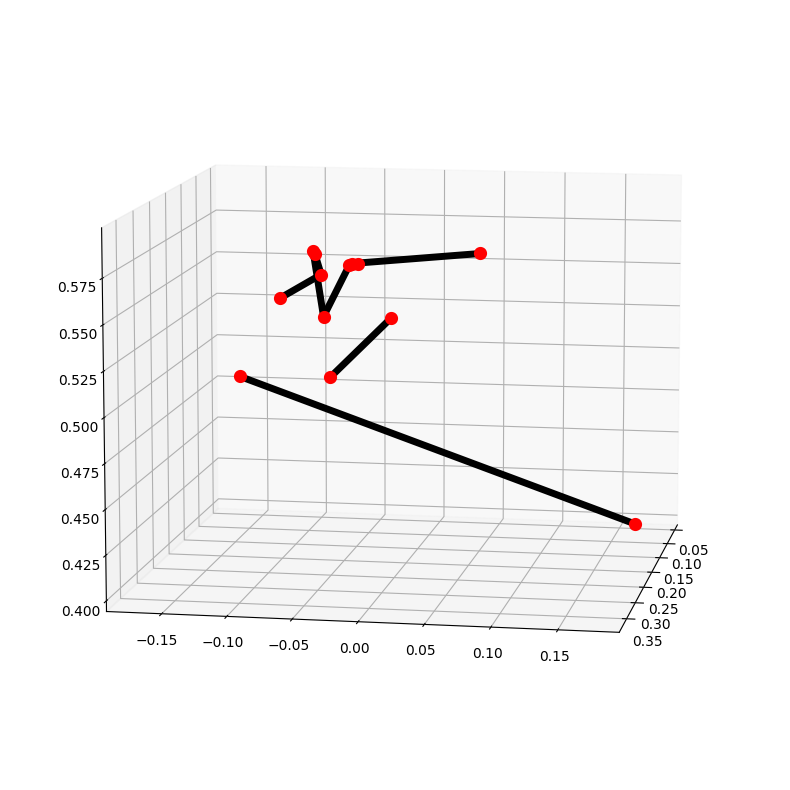

z: -974.3782806396484


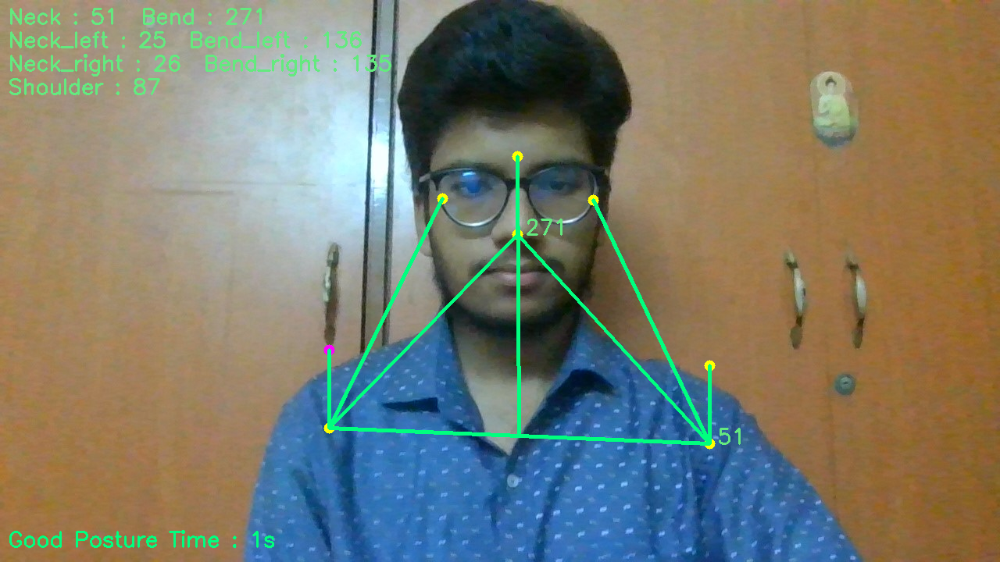

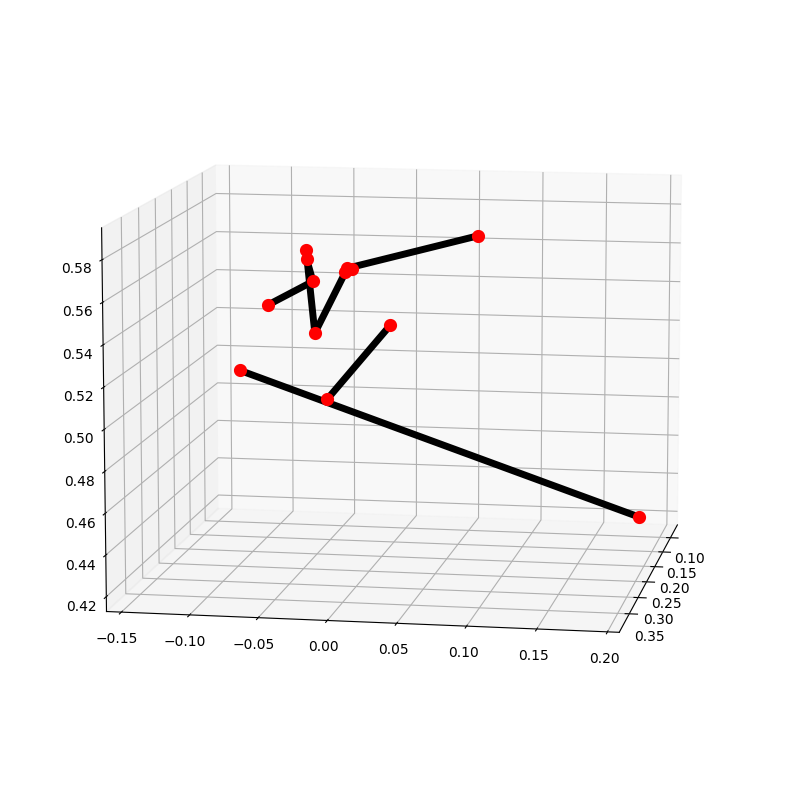

z: -1060.6587982177734


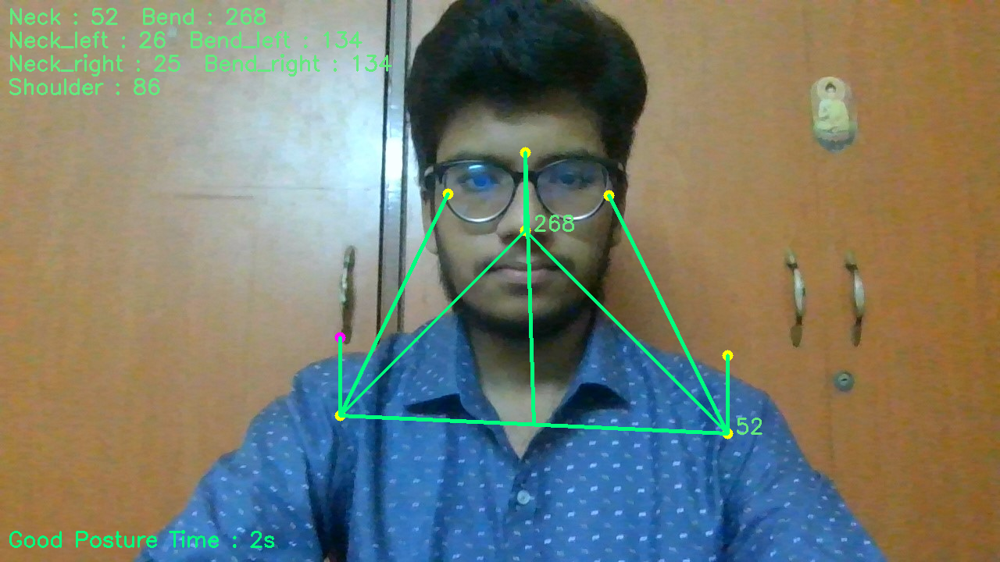

finished


In [25]:
# Initialize mediapipe pose class.
mp_pose = mp.solutions.pose
# Initializing mediapipe drawing class, useful for annotation.
mp_drawing = mp.solutions.drawing_utils 
BG_COLOR = (192, 192, 192) # gray
images = []
folder='/content/gdrive/MyDrive/suriyaa-images'
with mp_pose.Pose(
    static_image_mode=True,
    model_complexity=2,
    enable_segmentation=True,
    min_detection_confidence=0.5) as pose:
  for filename in os.listdir(folder):
      image = cv2.imread(os.path.join(folder,filename))
      if image is  None:
        break
  #file='/content/input.png'
  #image = cv2.imread(file)
    # Get height and width.
      h, w = image.shape[:2]
    # Convert the BGR image to RGB.
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process the image.
      keypoints = pose.process(image)
      
    # Convert the image back to BGR.
      image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Use lm and lmPose as representative of the following methods.
      lm = keypoints.pose_landmarks
      lmPose = mp_pose.PoseLandmark

    # Acquire the landmark coordinates.
    # Once aligned properly, left or right should not be a concern.      
    # Left shoulder.
      l_shldr_x = int(lm.landmark[lmPose.LEFT_SHOULDER].x * w)
      l_shldr_y = int(lm.landmark[lmPose.LEFT_SHOULDER].y * h)
    # Right shoulder
      r_shldr_x = int(lm.landmark[lmPose.RIGHT_SHOULDER].x * w)
      r_shldr_y = int(lm.landmark[lmPose.RIGHT_SHOULDER].y * h)
    # Left ear.
      l_ear_x = int(lm.landmark[lmPose.LEFT_EAR].x * w)
      l_ear_y = int(lm.landmark[lmPose.LEFT_EAR].y * h)

      r_ear_x = int(lm.landmark[lmPose.RIGHT_EAR].x * w)
      r_ear_y = int(lm.landmark[lmPose.RIGHT_EAR].y * h)
    # NOSE.
      l_nose_x = int(lm.landmark[lmPose.NOSE].x * w)
      l_nose_y = int(lm.landmark[lmPose.NOSE].y * h)
    # Calculate angles.
      l_neck_inclination = findAngle(l_shldr_x, l_shldr_y, l_ear_x, l_ear_y)
      l_bend_inclination = findAngle(l_nose_x, l_nose_y, l_shldr_x, l_shldr_y)
      r_neck_inclination = findAngle(r_shldr_x, r_shldr_y, r_ear_x, r_ear_y)
      r_bend_inclination = findAngle(l_nose_x, l_nose_y, r_shldr_x, r_shldr_y)
      shldr_inclination = findAngle(l_shldr_x, l_shldr_y, r_shldr_x, r_shldr_y)
    # Draw landmarks.
      cv2.circle(image, (l_shldr_x, l_shldr_y), 7, yellow, -1)
      cv2.circle(image, (r_shldr_x, r_shldr_y), 7, yellow, -1)
      cv2.circle(image, (l_ear_x, l_ear_y), 7, yellow, -1)
      cv2.circle(image, (r_ear_x, r_ear_y), 7, yellow, -1)
      mp_drawing.plot_landmarks(keypoints.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)
      z_nose=lm.landmark[lmPose.NOSE].z * w
      print(f'z: {lm.landmark[lmPose.NOSE].z * w}')
      if z_nose < -1100:
         cv2.putText(image, 'YOU ARE VERY CLOSER TO THE SCREEN', (10, 150), font, 0.9, red, 2)

    # Let's take y - coordinate of P3 100px above x1,  for display elegance.
    # Although we are taking y = 0 while calculating angle between P1,P2,P3.
      cv2.circle(image, (l_shldr_x, l_shldr_y - 100), 7, yellow, -1)
      cv2.circle(image, (r_shldr_x, r_shldr_y-100), 7, pink, -1)
      cv2.circle(image, (l_nose_x, l_nose_y), 7, yellow, -1)
  
    # Similarly, here we are taking y - coordinate 100px above x1. Note that
    # you can take any value for y, not necessarily 100 or 200 pixels.
      cv2.circle(image, (l_nose_x, l_nose_y - 100), 7, yellow, -1)

    # Put text, Posture and angle inclination.
    # Text string for display.
      angle_text_left = 'Neck_left : ' + str(int(l_neck_inclination)) + '  Bend_left : ' + str(int(l_bend_inclination))
      angle_text_right = 'Neck_right : ' + str(int(r_neck_inclination)) + '  Bend_right : ' + str(int(r_bend_inclination))
      angle_text_string = 'Neck : ' + str(int(l_neck_inclination+r_neck_inclination)) + '  Bend : ' + str(int(l_bend_inclination+r_bend_inclination))
      angle_text_shldr = 'Shoulder : ' + str(int(shldr_inclination))
      neck=l_neck_inclination+r_neck_inclination
      bend=l_bend_inclination+r_bend_inclination
      x_m_point = int((l_shldr_x +r_shldr_x )/2)
      y_m_point = int((l_shldr_y+r_shldr_y )/2)
    # Determine whether good posture or bad posture.
    # The threshold angles have been set based on intuition.
      if neck >= 50  and bend >=265:
         bad_frames = 0
         good_frames += 1# writing in a good frame posture 
         cv2.putText(image, angle_text_string, (10, 30), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_left, (10, 60), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_right, (10, 90), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_shldr, (10, 120), font, 0.9, light_green, 2)
         cv2.putText(image, str(int(neck)), (l_shldr_x + 10, l_shldr_y), font, 0.9, light_green, 2)
         cv2.putText(image, str(int(bend)), (l_nose_x + 10, l_nose_y), font, 0.9, light_green, 2)

        # Join landmarks.
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), green, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (r_shldr_x, r_shldr_y), green, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_ear_x, r_ear_y), green, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), green, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_shldr_x, r_shldr_y - 100), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (r_shldr_x, r_shldr_y), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), green, 4)
         cv2.line(image, (x_m_point,y_m_point), (l_nose_x, l_nose_y - 100), green, 4)

      else:
         good_frames = 0
         bad_frames += 1

         cv2.putText(image, angle_text_string, (10, 30), font, 0.9, red, 2)
         cv2.putText(image, angle_text_left, (10, 60), font, 0.9, red, 2)
         cv2.putText(image, angle_text_right, (10, 90), font, 0.9, red, 2)
         cv2.putText(image, angle_text_shldr, (10, 120), font, 0.9, red, 2)
         cv2.putText(image, str(int(neck)), (l_shldr_x + 10, l_shldr_y), font, 0.9, red, 2)
         cv2.putText(image, str(int(bend)), (l_nose_x + 10, l_nose_y), font, 0.9, red, 2)
      

        # Join landmarks.
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), red, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (r_shldr_x, r_shldr_y), red, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_ear_x, r_ear_y), red, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), red, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_shldr_x, r_shldr_y - 100), red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (r_shldr_x, r_shldr_y),red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), red, 4)
         cv2.line(image, (x_m_point,y_m_point), (l_nose_x, l_nose_y - 100), red, 4)
    # Calculate the time of remaining in a particular posture.
   # good_time = (1 / fps) * good_frames
   # bad_time =  (1 / fps) * bad_frames

    # Pose time.
      if good_frames > 0:
         time_string_good = 'Good Posture Time : ' + str(round(good_frames, 1)) + 's'
         cv2.putText(image, time_string_good, (10, h - 20), font, 0.9, green, 2)
      else:
         time_string_bad = 'Bad Posture Time : ' + str(round(bad_frames, 1)) + 's'
         cv2.putText(image, time_string_bad, (10, h - 20), font, 0.9, red, 2)

    # If you stay in bad posture for more than 3 minutes (180s) send an alert.
      if bad_frames > 0:
         sendWarning()
    # Write frames.
      annotated_image = image.copy()
    # Draw segmentation on the image.
    # To improve segmentation around boundaries, consider applying a joint
    # bilateral filter to "results.segmentation_mask" with "image".
      cv2_imshow(annotated_image)
print('finished')

In [26]:
# Initialize mediapipe pose class.
mp_pose = mp.solutions.pose 
pose = mp_pose.Pose() #calls the Pose function via the mp_pose variable 

# Initialize video capture object.
# For webcam input replace file name with 0.
file_name = '/content/final.mp4'
cap = cv2.VideoCapture(file_name)
print(file_name)
# Meta.
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_size = (width, height)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')

# Initialize video writer.
video_output = cv2.VideoWriter('/content/output.mp4', fourcc, fps, frame_size)

/content/final.mp4


In [27]:
print('Processing..')
while cap.isOpened():
      print('Processing..')
    # Capture frames.
      success, image = cap.read()
      if not success:
        print("Null.Frames")
        break
    # Get height and width.
      h, w = image.shape[:2]
    # Convert the BGR image to RGB.
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process the image.
      keypoints = pose.process(image)
      
    # Convert the image back to BGR.
      image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Use lm and lmPose as representative of the following methods.
      lm = keypoints.pose_landmarks
      lmPose = mp_pose.PoseLandmark

    # Acquire the landmark coordinates.
    # Once aligned properly, left or right should not be a concern.      
    # Left shoulder.
      l_shldr_x = int(lm.landmark[lmPose.LEFT_SHOULDER].x * w)
      l_shldr_y = int(lm.landmark[lmPose.LEFT_SHOULDER].y * h)
    # Right shoulder
      r_shldr_x = int(lm.landmark[lmPose.RIGHT_SHOULDER].x * w)
      r_shldr_y = int(lm.landmark[lmPose.RIGHT_SHOULDER].y * h)
    # Left ear.
      l_ear_x = int(lm.landmark[lmPose.LEFT_EAR].x * w)
      l_ear_y = int(lm.landmark[lmPose.LEFT_EAR].y * h)

      r_ear_x = int(lm.landmark[lmPose.RIGHT_EAR].x * w)
      r_ear_y = int(lm.landmark[lmPose.RIGHT_EAR].y * h)
    # NOSE.
      l_nose_x = int(lm.landmark[lmPose.NOSE].x * w)
      l_nose_y = int(lm.landmark[lmPose.NOSE].y * h)
    # Calculate angles. 
      l_neck_inclination = findAngle(l_shldr_x, l_shldr_y, l_ear_x, l_ear_y)
      l_bend_inclination = findAngle(l_nose_x, l_nose_y, l_shldr_x, l_shldr_y)
      r_neck_inclination = findAngle(r_shldr_x, r_shldr_y, r_ear_x, r_ear_y)
      r_bend_inclination = findAngle(l_nose_x, l_nose_y, r_shldr_x, r_shldr_y)
      shldr_inclination = findAngle(l_shldr_x, l_shldr_y, r_shldr_x, r_shldr_y)
    # Draw landmarks.
      cv2.circle(image, (l_shldr_x, l_shldr_y), 7, yellow, -1)
      cv2.circle(image, (r_shldr_x, r_shldr_y), 7, yellow, -1)
      cv2.circle(image, (l_ear_x, l_ear_y), 7, yellow, -1)
      cv2.circle(image, (r_ear_x, r_ear_y), 7, yellow, -1)
      #mp_drawing.plot_landmarks(keypoints.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)
      z_nose=lm.landmark[lmPose.NOSE].z * w
      print(f'z: {lm.landmark[lmPose.NOSE].z * w}')
      if z_nose < -1100:
         cv2.putText(image, 'YOU ARE VERY CLOSER TO THE SCREEN', (10, 150), font, 0.9, red, 2)

    # Let's take y - coordinate of P3 100px above x1,  for display elegance.
    # Although we are taking y = 0 while calculating angle between P1,P2,P3.
      cv2.circle(image, (l_shldr_x, l_shldr_y - 100), 7, yellow, -1)
      cv2.circle(image, (r_shldr_x, r_shldr_y-100), 7, pink, -1)
      cv2.circle(image, (l_nose_x, l_nose_y), 7, yellow, -1)
  
    # Similarly, here we are taking y - coordinate 100px above x1. Note that
    # you can take any value for y, not necessarily 100 or 200 pixels.
      cv2.circle(image, (l_nose_x, l_nose_y - 100), 7, yellow, -1)

    # Put text, Posture and angle inclination.
    # Text string for display.
      angle_text_left = 'Neck_left : ' + str(int(l_neck_inclination)) + '  Bend_left : ' + str(int(l_bend_inclination))
      angle_text_right = 'Neck_right : ' + str(int(r_neck_inclination)) + '  Bend_right : ' + str(int(r_bend_inclination))
      angle_text_string = 'Neck : ' + str(int(l_neck_inclination+r_neck_inclination)) + '  Bend : ' + str(int(l_bend_inclination+r_bend_inclination))
      angle_text_shldr = 'Shoulder : ' + str(int(shldr_inclination))
      neck=l_neck_inclination+r_neck_inclination
      bend=l_bend_inclination+r_bend_inclination
      x_m_point = int((l_shldr_x +r_shldr_x )/2)
      y_m_point = int((l_shldr_y+r_shldr_y )/2)
    # Determine whether good posture or bad posture.
    # The threshold angles have been set based on inition.
      if neck >= 45  and bend >=265:
         bad_frames = 0
         good_frames += 1# writing in a good frame posture 
         cv2.putText(image, angle_text_string, (10, 30), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_left, (10, 60), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_right, (10, 90), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_shldr, (10, 120), font, 0.9, light_green, 2)
         cv2.putText(image, str(int(neck)), (l_shldr_x + 10, l_shldr_y), font, 0.9, light_green, 2)
         cv2.putText(image, str(int(bend)), (l_nose_x + 10, l_nose_y), font, 0.9, light_green, 2)

        # Join landmarks.
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), green, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (r_shldr_x, r_shldr_y), green, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_ear_x, r_ear_y), green, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), green, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_shldr_x, r_shldr_y - 100), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (r_shldr_x, r_shldr_y), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), green, 4)
         cv2.line(image, (x_m_point,y_m_point), (l_nose_x, l_nose_y - 100), green, 4)

      else:
         good_frames = 0
         bad_frames += 1

         cv2.putText(image, angle_text_string, (10, 30), font, 0.9, red, 2)
         cv2.putText(image, angle_text_left, (10, 60), font, 0.9, red, 2)
         cv2.putText(image, angle_text_right, (10, 90), font, 0.9, red, 2)
         cv2.putText(image, angle_text_shldr, (10, 120), font, 0.9, red, 2)
         cv2.putText(image, str(int(neck)), (l_shldr_x + 10, l_shldr_y), font, 0.9, red, 2)
         cv2.putText(image, str(int(bend)), (l_nose_x + 10, l_nose_y), font, 0.9, red, 2)
      # Join landmarks.
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), red, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (r_shldr_x, r_shldr_y), red, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_ear_x, r_ear_y), red, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), red, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_shldr_x, r_shldr_y - 100), red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (r_shldr_x, r_shldr_y),red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), red, 4)
         cv2.line(image, (x_m_point,y_m_point), (l_nose_x, l_nose_y - 100), red, 4)
    # Calculate the time of remaining in a particular posture. 

   
    # Calculate the time of remaining in a particular posture.
         good_time = (1 / fps) * good_frames
         bad_time =  (1 / fps) * bad_frames

    # Pose time.
         if good_time > 0:
          time_string_good = 'Good Posture Time : ' + str(round(good_time, 1)) + 's'
          cv2.putText(image, time_string_good, (10, h - 20), font, 0.9, green, 2)
         else:
          time_string_bad = 'Bad Posture Time : ' + str(round(bad_time, 1)) + 's'
          cv2.putText(image, time_string_bad, (10, h - 20), font, 0.9, red, 2)

    # If you stay in bad posture for more than 3 minutes (180s) send an alert.
         if bad_time > 30:
            sendWarning()
    # Write frames.
         video_output.write(image)
print('Finished.')
cap.release()
video_output.release()

Processing..
Finished.


In [28]:
print('Processing..')
while cap.isOpened():
      print('processing..')
    # Capture frames.
      success, image = cap.read()
      if not success:
        print("Null.Frames")
        break
    # Get height and width.
      h, w = image.shape[:2]
    # Convert the BGR image to RGB.
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process the image.
      keypoints = pose.process(image)
      
    # Convert the image back to BGR.
      image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Use lm and lmPose as representative of the following methods.
      lm = keypoints.pose_landmarks
      lmPose = mp_pose.PoseLandmark

    # Acquire the landmark coordinates.
    # Once aligned properly, left or right should not be a concern.      
    # Left shoulder.
      l_shldr_x = int(lm.landmark[lmPose.LEFT_SHOULDER].x * w)
      l_shldr_y = int(lm.landmark[lmPose.LEFT_SHOULDER].y * h)
    # Right shoulder
      r_shldr_x = int(lm.landmark[lmPose.RIGHT_SHOULDER].x * w)
      r_shldr_y = int(lm.landmark[lmPose.RIGHT_SHOULDER].y * h)
    # Left ear.
      l_ear_x = int(lm.landmark[lmPose.LEFT_EAR].x * w)
      l_ear_y = int(lm.landmark[lmPose.LEFT_EAR].y * h)

      r_ear_x = int(lm.landmark[lmPose.RIGHT_EAR].x * w)
      r_ear_y = int(lm.landmark[lmPose.RIGHT_EAR].y * h)
    # NOSE.
      l_nose_x = int(lm.landmark[lmPose.NOSE].x * w)
      l_nose_y = int(lm.landmark[lmPose.NOSE].y * h)
    # Calculate angles. 
      l_neck_inclination = findAngle(l_shldr_x, l_shldr_y, l_ear_x, l_ear_y)
      l_bend_inclination = findAngle(l_nose_x, l_nose_y, l_shldr_x, l_shldr_y)
      r_neck_inclination = findAngle(r_shldr_x, r_shldr_y, r_ear_x, r_ear_y)
      r_bend_inclination = findAngle(l_nose_x, l_nose_y, r_shldr_x, r_shldr_y)
      shldr_inclination = findAngle(l_shldr_x, l_shldr_y, r_shldr_x, r_shldr_y)
    # Draw landmarks.
      cv2.circle(image, (l_shldr_x, l_shldr_y), 7, yellow, -1)
      cv2.circle(image, (r_shldr_x, r_shldr_y), 7, yellow, -1)
      cv2.circle(image, (l_ear_x, l_ear_y), 7, yellow, -1)
      cv2.circle(image, (r_ear_x, r_ear_y), 7, yellow, -1)
      mp_drawing.plot_landmarks(keypoints.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)
      z_nose=lm.landmark[lmPose.NOSE].z * w
      #print(f'z: {lm.landmark[lmPose.NOSE].z * w}')
      if z_nose < -1100:
         cv2.putText(image, 'YOU ARE VERY CLOSER TO THE SCREEN', (10, 150), font, 0.9, red, 2)

    # Let's take y - coordinate of P3 100px above x1,  for display elegance.
    # Although we are taking y = 0 while calculating angle between P1,P2,P3.
      cv2.circle(image, (l_shldr_x, l_shldr_y - 100), 7, yellow, -1)
      cv2.circle(image, (r_shldr_x, r_shldr_y-100), 7, pink, -1)
      cv2.circle(image, (l_nose_x, l_nose_y), 7, yellow, -1)
  
    # Similarly, here we are taking y - coordinate 100px above x1. Note that
    # you can take any value for y, not necessarily 100 or 200 pixels.
      cv2.circle(image, (l_nose_x, l_nose_y - 100), 7, yellow, -1)

    # Put text, Posture and angle inclination.
    # Text string for display.
      angle_text_left = 'Neck_left : ' + str(int(l_neck_inclination)) + '  Bend_left : ' + str(int(l_bend_inclination))
      angle_text_right = 'Neck_right : ' + str(int(r_neck_inclination)) + '  Bend_right : ' + str(int(r_bend_inclination))
      angle_text_string = 'Neck : ' + str(int(l_neck_inclination+r_neck_inclination)) + '  Bend : ' + str(int(l_bend_inclination+r_bend_inclination))
      angle_text_shldr = 'Shoulder : ' + str(int(shldr_inclination))
      neck=l_neck_inclination+r_neck_inclination
      bend=l_bend_inclination+r_bend_inclination
      x_m_point = int((l_shldr_x +r_shldr_x )/2)
      y_m_point = int((l_shldr_y+r_shldr_y )/2)
    # Determine whether good posture or bad posture.
    # The threshold angles have been set based on inition.
      if neck >= 50  and bend >=265:
         bad_frames = 0
         good_frames += 1# writing in a good frame posture 
         cv2.putText(image, angle_text_string, (10, 30), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_left, (10, 60), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_right, (10, 90), font, 0.9, light_green, 2)
         cv2.putText(image, angle_text_shldr, (10, 120), font, 0.9, light_green, 2)
         cv2.putText(image, str(int(neck)), (l_shldr_x + 10, l_shldr_y), font, 0.9, light_green, 2)
         cv2.putText(image, str(int(bend)), (l_nose_x + 10, l_nose_y), font, 0.9, light_green, 2)

        # Join landmarks.
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), green, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (r_shldr_x, r_shldr_y), green, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_ear_x, r_ear_y), green, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), green, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_shldr_x, r_shldr_y - 100), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (r_shldr_x, r_shldr_y), green, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), green, 4)
         cv2.line(image, (x_m_point,y_m_point), (l_nose_x, l_nose_y - 100), green, 4)

      else:
         good_frames = 0
         bad_frames += 1

         cv2.putText(image, angle_text_string, (10, 30), font, 0.9, red, 2)
         cv2.putText(image, angle_text_left, (10, 60), font, 0.9, red, 2)
         cv2.putText(image, angle_text_right, (10, 90), font, 0.9, red, 2)
         cv2.putText(image, angle_text_shldr, (10, 120), font, 0.9, red, 2)
         cv2.putText(image, str(int(neck)), (l_shldr_x + 10, l_shldr_y), font, 0.9, red, 2)
         cv2.putText(image, str(int(bend)), (l_nose_x + 10, l_nose_y), font, 0.9, red, 2)
      # Join landmarks.
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), red, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (r_shldr_x, r_shldr_y), red, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_ear_x, r_ear_y), red, 4)
         cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), red, 4)
         cv2.line(image, (r_shldr_x, r_shldr_y), (r_shldr_x, r_shldr_y - 100), red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (r_shldr_x, r_shldr_y),red, 4)
         cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), red, 4)
         cv2.line(image, (x_m_point,y_m_point), (l_nose_x, l_nose_y - 100), red, 4)
    # Calculate the time of remaining in a particular posture. 

   
    # Calculate the time of remaining in a particular posture.
         good_time = (1 / fps) * good_frames
         bad_time =  (1 / fps) * bad_frames

    # Pose time.
         if good_time > 0:
          time_string_good = 'Good Posture Time : ' + str(round(good_time, 1)) + 's'
          cv2.putText(image, time_string_good, (10, h - 20), font, 0.9, green, 2)
         else:
          time_string_bad = 'Bad Posture Time : ' + str(round(bad_time, 1)) + 's'
          cv2.putText(image, time_string_bad, (10, h - 20), font, 0.9, red, 2)

    # If you stay in bad posture for more than 3 minutes (180s) send an alert.
         if bad_time > 30:
            sendWarning()
    # Write frames.
         video_output.write(image)
print('Finished.')
cap.release()
video_output.release()

Processing..
Finished.


In [29]:
print('Processing..')
while cap.isOpened():
    # Capture frames.
    success, image = cap.read()
    if not success:
        print("Null.Frames")
        break
    # Get fps.
    fps = cap.get(cv2.CAP_PROP_FPS)
    # Get height and width.
    h, w = image.shape[:2]

    # Convert the BGR image to RGB.
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process the image.
    keypoints = pose.process(image)

    # Convert the image back to BGR.
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Use lm and lmPose as representative of the following methods.
    lm = keypoints.pose_landmarks
    lmPose = mp_pose.PoseLandmark

    # Acquire the landmark coordinates.
    # Once aligned properly, left or right should not be a concern.      
    # Left shoulder.
    l_shldr_x = int(lm.landmark[lmPose.LEFT_SHOULDER].x * w)
    l_shldr_y = int(lm.landmark[lmPose.LEFT_SHOULDER].y * h)
    # Right shoulder
    r_shldr_x = int(lm.landmark[lmPose.RIGHT_SHOULDER].x * w)
    r_shldr_y = int(lm.landmark[lmPose.RIGHT_SHOULDER].y * h)
    # Left ear.
    l_ear_x = int(lm.landmark[lmPose.LEFT_EAR].x * w)
    l_ear_y = int(lm.landmark[lmPose.LEFT_EAR].y * h)
    # Left hip.
    l_nose_x = int(lm.landmark[lmPose.NOSE].x * w)
    l_nose_y = int(lm.landmark[lmPose.NOSE].y * h)

    # Calculate distance between left shoulder and right shoulder points.
    offset = findDistance(l_shldr_x, l_shldr_y, r_shldr_x, r_shldr_y)

    # Assist to align the camera to point at the view of the person.
    # Offset threshold 30 is based on results obtained from analysis over 100 samples.
    if offset < 100:
        cv2.putText(image, str(int(offset)) + ' Aligned', (w - 150, 30), font, 0.9, green, 2)
    else:
        cv2.putText(image, str(int(offset)) + ' Not Aligned', (w - 150, 30), font, 0.9, red, 2)

    # Calculate angles.
    neck_inclination = findAngle(l_shldr_x, l_shldr_y, l_ear_x, l_ear_y)
    torso_inclination = findAngle(l_nose_x, l_nose_y, l_shldr_x, l_shldr_y)

    # Draw landmarks.
    cv2.circle(image, (l_shldr_x, l_shldr_y), 7, yellow, -1)
    cv2.circle(image, (l_ear_x, l_ear_y), 7, yellow, -1)

    # Let's take y - coordinate of P3 100px above x1,  for display elegance.
    # Although we are taking y = 0 while calculating angle between P1,P2,P3.
    cv2.circle(image, (l_shldr_x, l_shldr_y - 100), 7, yellow, -1)
    cv2.circle(image, (r_shldr_x, r_shldr_y), 7, pink, -1)
    cv2.circle(image, (l_nose_x, l_nose_y), 7, yellow, -1)

    # Similarly, here we are taking y - coordinate 100px above x1. Note that
    # you can take any value for y, not necessarily 100 or 200 pixels.
    cv2.circle(image, (l_nose_x, l_nose_y - 100), 7, yellow, -1)

    # Put text, Posture and angle inclination.
    # Text string for display.
    angle_text_string = 'Neck : ' + str(int(neck_inclination)) + '  Torso : ' + str(int(torso_inclination))

    # Determine whether good posture or bad posture.
    # The threshold angles have been set based on intuition.
    if neck_inclination >= 15 and neck_inclination <= 22 and torso_inclination >=140 and torso_inclination <=150:
        bad_frames = 0
        good_frames += 1
# writing in a good frame posture 
        cv2.putText(image, angle_text_string, (10, 30), font, 0.9, light_green, 2)
        cv2.putText(image, str(int(neck_inclination)), (l_shldr_x + 10, l_shldr_y), font, 0.9, light_green, 2)
        cv2.putText(image, str(int(torso_inclination)), (l_nose_x + 10, l_nose_y), font, 0.9, light_green, 2)

        # Join landmarks.
        cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), green, 4)
        cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), green, 4)
        cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), green, 4)
        cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), green, 4)

    else:
        good_frames = 0
        bad_frames += 1

        cv2.putText(image, angle_text_string, (10, 30), font, 0.9, red, 2)
        cv2.putText(image, str(int(neck_inclination)), (l_shldr_x + 10, l_shldr_y), font, 0.9, red, 2)
        cv2.putText(image, str(int(torso_inclination)), (l_nose_x + 10, l_nose_y), font, 0.9, red, 2)

        # Join landmarks.
        cv2.line(image, (l_shldr_x, l_shldr_y), (l_ear_x, l_ear_y), red, 4)
        cv2.line(image, (l_shldr_x, l_shldr_y), (l_shldr_x, l_shldr_y - 100), red, 4)
        cv2.line(image, (l_nose_x, l_nose_y), (l_shldr_x, l_shldr_y), red, 4)
        cv2.line(image, (l_nose_x, l_nose_y), (l_nose_x, l_nose_y - 100), red, 4)

    # Calculate the time of remaining in a particular posture.
    good_time = (1 / fps) * good_frames
    bad_time =  (1 / fps) * bad_frames

    # Pose time.
    if good_time > 0:
        time_string_good = 'Good Posture Time : ' + str(round(good_time, 1)) + 's'
        cv2.putText(image, time_string_good, (10, h - 20), font, 0.9, green, 2)
    else:
        time_string_bad = 'Bad Posture Time : ' + str(round(bad_time, 1)) + 's'
        cv2.putText(image, time_string_bad, (10, h - 20), font, 0.9, red, 2)

    # If you stay in bad posture for more than 3 minutes (180s) send an alert.
    if bad_time > 30:
        sendWarning()
    # Write frames.
    video_output.write(image)
print('Finished.')
cap.release()
video_output.release()

Processing..
Finished.
